# ClimateNet Analysis

In [1]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt

In [2]:
file_path = "/glade/scratch/jet/ClimateNet/"

In [3]:
# LBL pre-trained model run on CESM output (4 inputs: TMQ, PSL, U850, V850)
LBL_year_folder = "output.cgnet.2000/"

In [4]:
# NCAR re-trained model run on CESM output (4 inputs)
NCAR_year_folder = "output.cgnet.4chan/"
# NCAR re-trained model run on CESM output (1 input: TMQ)
NCAR_1chan_year_folder = "output.cgnet/"

## Read in segmentation masks

In [5]:
date_glob = "*547[7-8]*.nc" # trying to read in ~3-4 weeks around end of January

In [6]:
#output = xr.open_mfdataset(file_path+LBL_year_folder+date_glob, combine='by_coords')
output = xr.open_mfdataset(file_path+NCAR_year_folder+date_glob, combine='by_coords')
#output = xr.open_mfdataset(file_path+NCAR_1chan_year_folder+date_glob, combine='by_coords')

In [7]:
output.time # check the dates

<xarray.DataArray 'time' (time: 160)>
array([cftime.DatetimeNoLeap(2000, 1, 21, 3, 0, 0, 0, 4, 21),
       cftime.DatetimeNoLeap(2000, 1, 21, 6, 0, 0, 0, 4, 21),
       cftime.DatetimeNoLeap(2000, 1, 21, 9, 0, 0, 0, 4, 21),
       cftime.DatetimeNoLeap(2000, 1, 21, 12, 0, 0, 0, 4, 21),
       cftime.DatetimeNoLeap(2000, 1, 21, 15, 0, 0, 0, 4, 21),
       cftime.DatetimeNoLeap(2000, 1, 21, 18, 0, 0, 0, 4, 21),
       cftime.DatetimeNoLeap(2000, 1, 21, 21, 0, 0, 0, 4, 21),
       cftime.DatetimeNoLeap(2000, 1, 22, 0, 0, 0, 0, 5, 22),
       cftime.DatetimeNoLeap(2000, 1, 22, 3, 0, 0, 0, 5, 22),
       cftime.DatetimeNoLeap(2000, 1, 22, 6, 0, 0, 0, 5, 22),
       cftime.DatetimeNoLeap(2000, 1, 22, 9, 0, 0, 0, 5, 22),
       cftime.DatetimeNoLeap(2000, 1, 22, 12, 0, 0, 0, 5, 22),
       cftime.DatetimeNoLeap(2000, 1, 22, 15, 0, 0, 0, 5, 22),
       cftime.DatetimeNoLeap(2000, 1, 22, 18, 0, 0, 0, 5, 22),
       cftime.DatetimeNoLeap(2000, 1, 22, 21, 0, 0, 0, 5, 22),
       cftime.DatetimeNo

In [8]:
output_tag = output.output_tag

## Make the animation

In [9]:
import matplotlib.colors 
import cartopy.crs as ccrs
from cartopy.util import add_cyclic_point

In [10]:
cmap_all = matplotlib.colors.ListedColormap(['w', 'green', 'red'])
bounds = [0, 0.99, 1.99, 2.99]
norm = matplotlib.colors.BoundaryNorm(bounds, cmap_all.N)

Test plot of the first time index

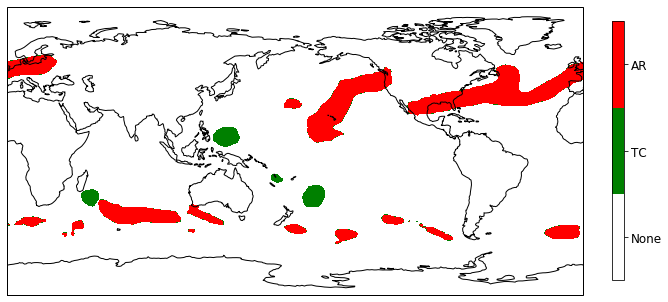

In [11]:
fig = plt.figure(figsize=(8,6))

ax = fig.add_axes([0.,0.,1.,1.], projection=ccrs.PlateCarree(central_longitude=180.0)) # shift map center to highlight Pacific

lat = output_tag.lat
lon = output_tag.lon
cf = ax.contourf(lon, lat, output_tag[0,:,:], cmap=cmap_all, vmin=0, vmax=2.99, levels=bounds, transform=ccrs.PlateCarree())

ax.coastlines()

import matplotlib as mpl
cbar_ax = fig.add_axes([1.05, 0.2, 0.02, 0.6])
norm = mpl.colors.Normalize(vmin=0, vmax=2.99)
cb1 = mpl.colorbar.ColorbarBase(cbar_ax, 
                                cmap=cmap_all,
                                norm=norm,
                                orientation='vertical', 
                               ticks=bounds)
labels = np.array([0, 0.99, 1.99])
loc    = labels + .5
tick_1 = ['None','TC','AR']
cb1.set_ticks(loc)
cb1.ax.set_yticklabels(tick_1)
cb1.ax.tick_params(labelsize=12)

Create the animation

In [23]:
for counter, ind in enumerate(np.arange(0,len(output_tag))):
    
    iterate = "{:03d}".format(counter) # modify significant digits depends on length of files

    fig = plt.figure(figsize=(8,6))
    ax = fig.add_axes([0.,0.,1.,1.], projection=ccrs.PlateCarree(central_longitude=180.0))
    
    lat = output_tag.lat
    lon = output_tag.lon
    cf = ax.contourf(lon, lat, output_tag[ind,:,:], cmap=cmap_all, vmin=0, vmax=2.99, levels=bounds, transform=ccrs.PlateCarree())
    
    ax.coastlines()
    
    import matplotlib as mpl
    cbar_ax = fig.add_axes([1.05, 0.2, 0.02, 0.6])
    norm = mpl.colors.Normalize(vmin=0, vmax=2.99)
    cb1 = mpl.colorbar.ColorbarBase(cbar_ax, 
                                cmap=cmap_all,
                                norm=norm,
                                orientation='vertical', 
                               ticks=bounds)
    labels = np.array([0, 0.99, 1.99])
    loc    = labels + .5
    tick_1 = ['None','TC','AR']
    cb1.set_ticks(loc)
    cb1.ax.set_yticklabels(tick_1)
    cb1.ax.tick_params(labelsize=12)
    
    # clear out existing .png files before running this?
    plt.savefig(f'../figures/climatenet_animation/climatenet_2000_{iterate}.png', bbox_inches='tight', dpi=200)
    #plt.show()
    plt.close()

In [24]:
import subprocess

def grid2gif(image_str, output_gif):
    str1 = 'convert -delay 8 -loop 0 ' + image_str  + ' ' + output_gif
    subprocess.call(str1, shell=True)

# LBL pre-trained
#grid2gif("../figures/climatenet_animation/climatenet_2000_{000..159}.png", "../figures/climatenet_animation/climatenet_2000-01-21-3z_2000-02-10-0z.gif")
# NCAR re-trained 4 channels
#grid2gif("../figures/climatenet_animation/climatenet_2000_{000..159}.png", "../figures/climatenet_animation/climatenet-NCAR4ch_2000-01-21-3z_2000-02-10-0z.gif")
# NCAR re-trained 1 channel
grid2gif("../figures/climatenet_animation/climatenet_2000_{000..159}.png", "../figures/climatenet_animation/climatenet-NCAR1ch_2000-01-21-3z_2000-02-10-0z.gif")


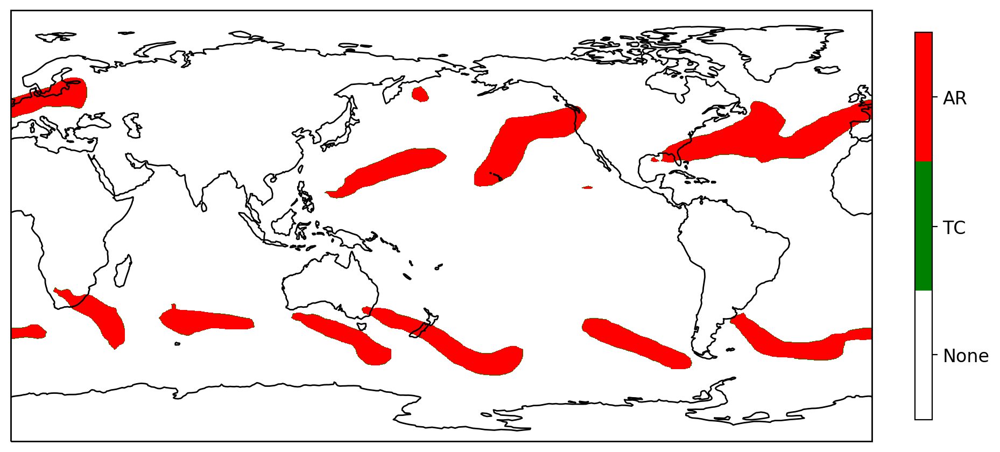

In [25]:
def show_gif(fname):
    import base64
    from IPython import display
    with open(fname, 'rb') as fd:
        b64 = base64.b64encode(fd.read()).decode('ascii')
    return display.HTML(f'<img src="data:image/gif;base64,{b64}" />')

#show_gif('../figures/climatenet_animation/climatenet_2000-01-21-3z_2000-02-10-0z.gif')
#show_gif('../figures/climatenet_animation/climatenet-NCAR4ch_2000-01-21-3z_2000-02-10-0z.gif')
show_gif('../figures/climatenet_animation/climatenet-NCAR1ch_2000-01-21-3z_2000-02-10-0z.gif')

### Static plot of a specific time point

In [55]:
# select time index
#t = '2000-07-05T12'
t = '2000-01-21T21'

In [57]:
# modify cmap for better display
cmap_all_cb = matplotlib.colors.ListedColormap(['w', 'blue', 'orange'])
norm_cb = matplotlib.colors.BoundaryNorm(bounds, cmap_all_cb.N)

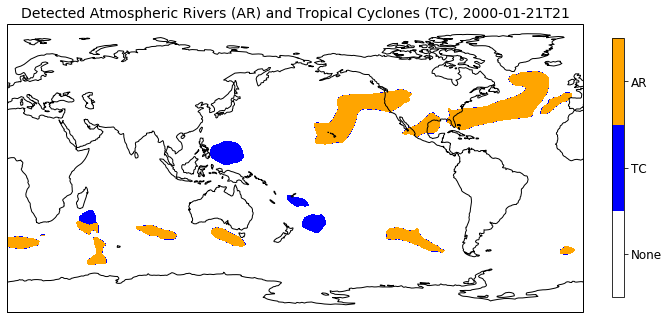

In [69]:
fig = plt.figure(figsize=(8,6))

ax = fig.add_axes([0.,0.,1.,1.], projection=ccrs.PlateCarree(central_longitude=180.0)) # shift map center to highlight Pacific

lat = output_tag.lat
lon = output_tag.lon
cf = ax.contourf(lon, lat, output_tag.sel(time=t)[0], cmap=cmap_all_cb, vmin=0, vmax=2.99, levels=bounds, transform=ccrs.PlateCarree())

ax.coastlines()

import matplotlib as mpl
cbar_ax = fig.add_axes([1.05, 0.2, 0.02, 0.6])
norm = mpl.colors.Normalize(vmin=0, vmax=2.99)
cb1 = mpl.colorbar.ColorbarBase(cbar_ax, 
                                cmap=cmap_all_cb,
                                norm=norm_cb,
                                orientation='vertical', 
                               ticks=bounds)
labels = np.array([0, 0.99, 1.99])
loc    = labels + .5
tick_1 = ['None','TC','AR']
cb1.set_ticks(loc)
cb1.ax.set_yticklabels(tick_1)
cb1.ax.tick_params(labelsize=12)

ax.set_title('Detected Atmospheric Rivers (AR) and Tropical Cyclones (TC), '+t, fontsize=14);

#plt.savefig('climatenet_2000-01-21-21z.pdf', bbox_inches='tight')